In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/finaldataset.zip -d /tmp/

Streaming output truncated to the last 5000 lines.
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/ccbfedd0-e8d7-4f09-aa7b-98213e408c39___PSU_CG 2216_new30degFlipLR.JPG  
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/3ecbb7b8-ad66-4944-886e-de2ae2c2c35e___PSU_CG 2095_180deg.JPG  
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/8b43c3f3-73ae-47bc-a620-079ebeeb10a4___PSU_CG 2094_270deg.JPG  
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/f73758a1-230b-49a7-87ae-7265232b6b67___PSU_CG 2128_270deg.JPG  
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/8e59061b-3802-4297-8724-a001efb95268___PSU_CG 2064_180deg.JPG  
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/57b10f20-7819-40b1-924c-b484c42c515f___PSU_CG 2356_newPixel25.JPG  
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/6804695f-56f8-4ff9-90f8-69ee95097463___PSU_CG 2067.JPG  
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/69d3740b-5aba-47e2-ae2f-46541333c3a5___PSU_CG 2420.JPG  
  inflating: /t

In [ ]:
import os                       # for working with files
import numpy as np              # for numerical computationss
import pandas as pd             # for working with dataframes
import torch                    # Pytorch module 
import matplotlib.pyplot as plt # for plotting informations on graph and images using tensors
import torch.nn as nn           # for creating  neural networks
from torch.utils.data import DataLoader # for dataloaders 
from PIL import Image           # for checking images
import seaborn as sns
import torch.nn.functional as F # for functions for calculating loss
import torchvision
import torchvision.transforms as transforms   # for transforming images into tensors 
from torchvision.utils import make_grid       # for data checking
from torchvision.datasets import ImageFolder  # for working with classes and images
from torchsummary import summary              # for getting the summary of our model
import cv2
%matplotlib inline

In [ ]:
data_dir = "/tmp"
train_dir = data_dir + "/train"
valid_dir = data_dir + "/valid"
diseases = os.listdir(train_dir)
base_path_train =data_dir+"/train/" 
base_path_val =data_dir+"/valid/" 

In [ ]:
diseases = os.listdir(train_dir)
print("Total classes of Diseases :")
print(len(diseases))

Total classes of Diseases :
25


In [ ]:
print("Diseases in the dataset")
print(diseases)

Diseases in the dataset
['Potato___Late_blight', 'Tomato___Bacterial_spot', 'Grape___Esca_(Black_Measles)', 'Tomato___Leaf_Mold', 'Corn_(maize)___healthy', 'Apple___Apple_scab', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___healthy', 'Potato___Early_blight', 'Apple___Cedar_apple_rust', 'Tomato___Late_blight', 'Potato___healthy', 'Grape___Black_rot', 'Corn_(maize)___Common_rust_', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Apple___healthy', 'Apple___Black_rot', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Tomato___Early_blight', 'Tomato___Tomato_mosaic_virus', 'Tomato___Septoria_leaf_spot']


In [ ]:
crops=[]
cnt=0
cnt_healthy=0
for i in diseases:
  s=i.split("___")
  if(s[0] not in crops):
    crops.append(s[0])
  if(s[1]=="healthy"):
    cnt_healthy+=1
  if(s[1]!="healthy"):
    cnt+=1

In [ ]:
print("Crops Names are as below:")
for i in crops:
  print(f"{crops.index(i)+1}]{i}")

Crops Names are as below:
1]Potato
2]Tomato
3]Grape
4]Corn_(maize)
5]Apple


In [ ]:
print("Number of Crops :")
print(cnt_healthy)
print("Number of Diseases to be identified :")
print(cnt)

Number of Crops :
5
Number of Diseases to be identified :
20


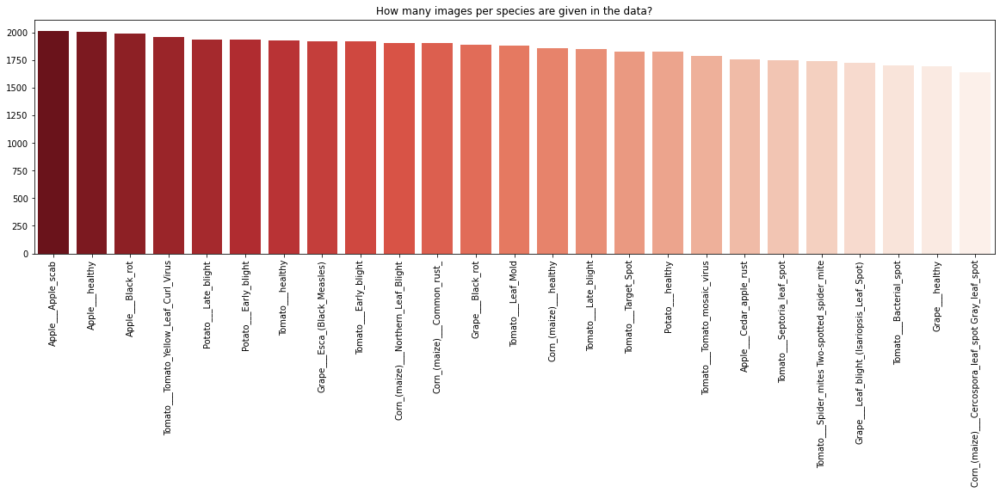

In [ ]:
subfolders = os.listdir(base_path_train)
names = []
counts = []

for folder in subfolders:
    images = os.listdir(base_path_train +folder)
    names.append(folder)
    counts.append(len(images))

counts = np.array(counts)
names = np.array(names)

idx = np.argsort(counts)[::-1]
    
plt.figure(figsize=(20,5))    
sns.barplot(x=names[idx], y=counts[idx], palette="Reds_r")
plt.xticks(rotation=90);
plt.title("How many images per species are given in the data?");



total_images = 0
for folder in subfolders:
    total_images += len(os.listdir(base_path_train + folder))

plantstate = pd.DataFrame(index=np.arange(0, total_images), columns=["width", "height", "species"])

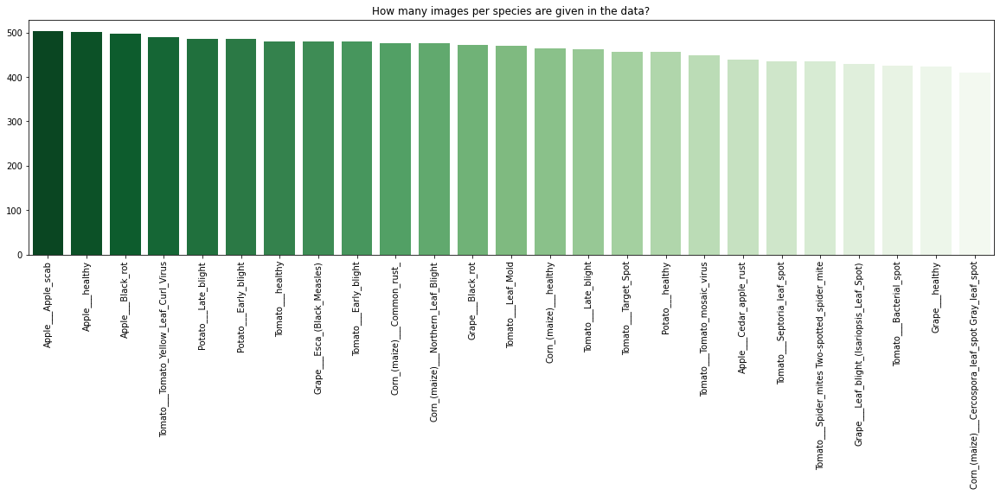

In [ ]:
subfolders = os.listdir(base_path_val)
names = []
counts = []

for folder in subfolders:
    images = os.listdir(base_path_val +folder)
    names.append(folder)
    counts.append(len(images))

counts = np.array(counts)
names = np.array(names)

idx = np.argsort(counts)[::-1]
    
plt.figure(figsize=(20,5))    
sns.barplot(x=names[idx], y=counts[idx], palette="Greens_r")
plt.xticks(rotation=90);
plt.title("How many images per species are given in the data?");



total_images = 0
for folder in subfolders:
    total_images += len(os.listdir(base_path_val + folder))

plantstate = pd.DataFrame(index=np.arange(0, total_images), columns=["width", "height", "species"])

Text(0.5, 1.0, 'distribution of pixels')

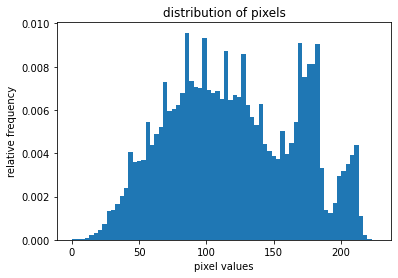

In [ ]:
# load the image
img_path = '/tmp/train/Apple___Apple_scab/00075aa8-d81a-4184-8541-b692b78d398a___FREC_Scab 3335.JPG'
img = Image.open(img_path)

# convert PIL image to numpy array
img_np = np.array(img)

# plot the pixel values
plt.hist(img_np.ravel(), bins=70, density=True)
plt.xlabel("pixel values")
plt.ylabel("relative frequency")
plt.title("distribution of pixels")

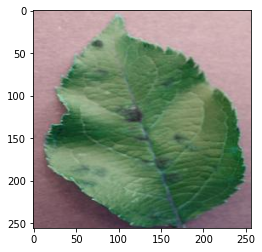

In [ ]:
imgg=cv2.imread('/tmp/train/Apple___Apple_scab/00075aa8-d81a-4184-8541-b692b78d398a___FREC_Scab 3335.JPG')
plt.imshow(imgg)

Text(0.5, 1.0, 'distribution of pixels')

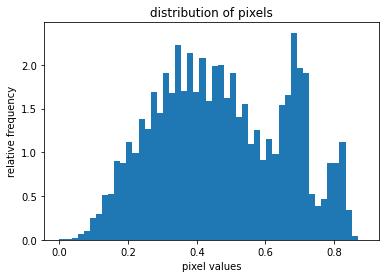

In [ ]:
# define custom transform function
transform = transforms.Compose([
	transforms.ToTensor()
])

# transform the pIL image to tensor
# image
img_tr = transform(img)

# Convert tensor image to numpy array
img_np = np.array(img_tr)

# plot the pixel values
plt.hist(img_np.ravel(), bins=50, density=True)
plt.xlabel("pixel values")
plt.ylabel("relative frequency")
plt.title("distribution of pixels")

In [ ]:
img_tr = transform(img)
 
# calculate mean and std
mean, std = img_tr.mean([1,2]), img_tr.std([1,2])
 
# print mean and std
print("mean and std before normalize:")
print("Mean of the image:", mean)
print("Std of the image:", std)

mean and std before normalize:
Mean of the image: tensor([0.4340, 0.5105, 0.4700])
Std of the image: tensor([0.1756, 0.1385, 0.2256])


Text(0.5, 1.0, 'distribution of pixels')

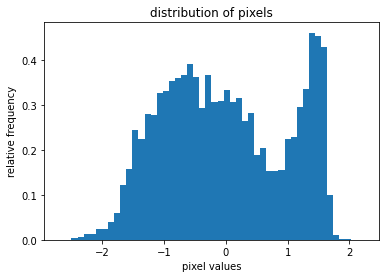

In [ ]:
transform_norm = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])
 
# get normalized image
img_normalized = transform_norm(img)
 
# convert normalized image to numpy
# array
img_np = np.array(img_normalized)
 
# plot the pixel values
plt.hist(img_np.ravel(), bins=50, density=True)
plt.xlabel("pixel values")
plt.ylabel("relative frequency")
plt.title("distribution of pixels")

([], [])

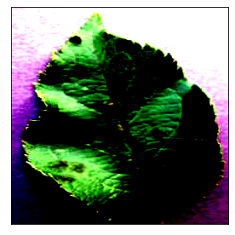

In [ ]:
img_normalized = transform_norm(img)
 
# convert this image to numpy array
img_normalized = np.array(img_normalized)
 
# transpose from shape of (3,,) to shape of (,,3)
img_normalized = img_normalized.transpose(1, 2, 0)
 
# display the normalized image
plt.imshow(img_normalized)
plt.xticks([])
plt.yticks([])

In [ ]:
dataset = torchvision.datasets.ImageFolder(root=train_dir, transform=transforms.ToTensor())
dataloader = torch.utils.data.DataLoader(dataset, batch_size=32, num_workers=2)

# Initialize variables to accumulate the mean and standard deviation
mean = 0.
std = 0.
n_images = 0

# Iterate over batches of images and accumulate mean and std
for images, _ in dataloader:
    batch_size = images.size(0)
    images = images.view(batch_size, images.size(1), -1)
    mean += images.mean(2).sum(0)
    std += images.std(2).sum(0)
    n_images += batch_size

# Calculate the overall mean and standard deviation of the dataset
mean /= n_images
std /= n_images

print(f"Mean: {mean}")
print(f"Standard deviation: {std}")

Mean: tensor([0.4616, 0.4866, 0.4177])
Standard deviation: tensor([0.1824, 0.1604, 0.1982])


In [ ]:
mean=[0.4616, 0.4866, 0.4177]
std=[0.1824, 0.1604, 0.1982]
random_seed = 7
torch.manual_seed(random_seed)

In [ ]:
train_transform_n = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
     transforms.ToTensor(),
     transforms.Normalize(
       mean,std
    ),
   
   
])
train_data_n =ImageFolder(
  root=train_dir, transform=train_transform_n
)
train_loader_n = DataLoader(
  train_data_n, 
  batch_size=32, 
  shuffle=True, 
  num_workers=2,
  pin_memory=True
)

In [ ]:
valid_transform_n = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(
       mean,std
    ),
    
    
])
valid_data_n =ImageFolder(
  root=valid_dir, transform=valid_transform_n
)
valid_dl = DataLoader(valid_data_n, batch_size=32, num_workers=2, pin_memory=True)

Normalized image 


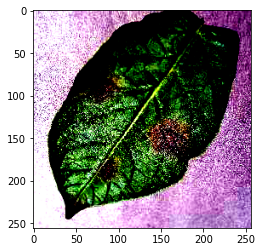

In [ ]:
images, labels = next(iter(train_loader_n))

def display_image(images):
  images_np = images.numpy()
  img_plt = images_np.transpose(0,2,3,1)
  # display 5th image from dataset
  plt.imshow(img_plt[4])
print("Normalized image ")
display_image(images)

In [ ]:
def show_batch(data):
    for images, labels in data:
        fig, ax = plt.subplots(figsize=(35, 35))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=8).permute(1, 2, 0))
        break

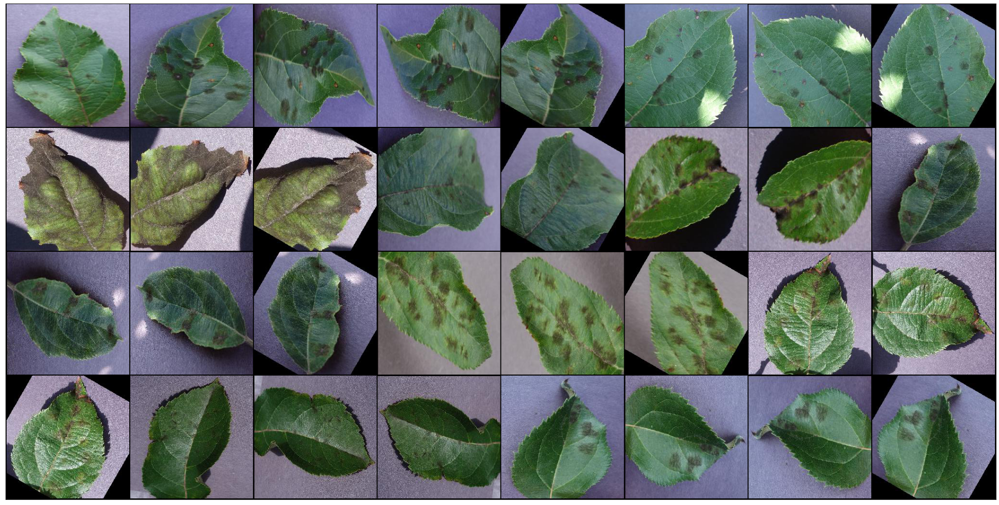

In [ ]:
show_batch(dataloader) 

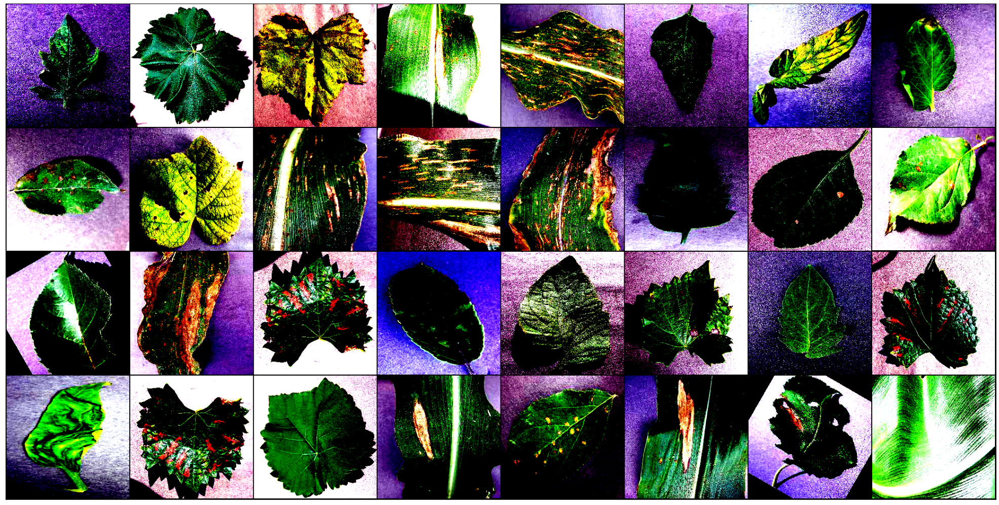

In [ ]:
show_batch(train_loader_n) 

In [ ]:
img, label = train_data_n[0]
print(img.shape, label)

torch.Size([3, 256, 256]) 0


In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available:
        return torch.device("cuda")
    else:
        return torch.device("cpu")

# for moving data to device (CPU or GPU)
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

# for loading in the device (GPU if available else CPU)
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)
        
    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_loader_n = DeviceDataLoader(train_loader_n, device)
valid_dl = DeviceDataLoader(valid_dl, device)

NameError: ignored

In [ ]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [ ]:
# base class for the model
class ImageClassificationBase(nn.Module):
    
    def training_step(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                   # Generate prediction
        loss = F.cross_entropy(out, labels)  # Calculate loss
        acc = accuracy(out, labels)          # Calculate accuracy
        return {"val_loss": loss.detach(), "val_accuracy": acc}
    
    def validation_epoch_end(self, outputs):
        batch_losses = [x["val_loss"] for x in outputs]
        batch_accuracy = [x["val_accuracy"] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()       # Combine loss  
        epoch_accuracy = torch.stack(batch_accuracy).mean()
        return {"val_loss": epoch_loss, "val_accuracy": epoch_accuracy} # Combine accuracies
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], last_lr: {:.5f}, train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['lrs'][-1], result['train_loss'], result['val_loss'], result['val_accuracy']))
        

In [ ]:
def cnn_without_pooling(input_channels,output_channels):
    kernel_size=3;
    padding=1;
    layers = []
    layers.append(nn.Conv2d(input_channels, output_channels, kernel_size, padding=1))
    layers.append(nn.BatchNorm2d(output_channels))
    layers.append(nn.ReLU(inplace=True))
    return nn.Sequential(*layers)


def cnn_with_pooling(input_channels, output_channels):
    kernel_size=3;
    padding=1;
    layers = [nn.Conv2d(input_channels, output_channels, kernel_size, padding=1),
             nn.BatchNorm2d(output_channels),
             nn.ReLU(inplace=True),
             nn.MaxPool2d(4)]
    return nn.Sequential(*layers)

In [ ]:
# resnet architecture 
class ResNet_9(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()
        
        self.conv_block1 = cnn_without_pooling(in_channels, 64)
        self.conv_block2 = cnn_with_pooling(64, 128) # out_dim : 128 x 64 x 64 
        self.residual_block1 = nn.Sequential(cnn_without_pooling(128, 128),cnn_without_pooling(128, 128))
        
        self.conv_block3 =  cnn_with_pooling(128, 256) # out_dim : 256 x 16 x 16
        self.conv_block4 =  cnn_with_pooling(256, 512) # out_dim : 512 x 4 x 44
        self.residual_block2 = nn.Sequential(cnn_without_pooling(512, 512),cnn_without_pooling(512, 512))
        
        self.fc = nn.Sequential(nn.MaxPool2d(4),
                                       nn.Flatten(),
                                       nn.Linear(512, num_diseases))
        
    def forward(self, input):
        output = self.conv_block1(input)
        output = self.conv_block2(output)
        output = self.residual_block1(output) + output
        output = self.conv_block3(output)
        output = self.conv_block4(output)
        output = self.residual_block2(output) + output
        output = self.fc(output)
        return output  

In [ ]:
model = to_device(ResNet_9(3, 25), device) 
model

ResNet_9(
  (conv_block1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv_block2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (residual_block1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

In [ ]:
# getting summary of the model
INPUT_SHAPE = (3, 256, 256)
print(summary(model.cuda(), (INPUT_SHAPE)))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4        [-1, 128, 256, 256]          73,856
       BatchNorm2d-5        [-1, 128, 256, 256]             256
              ReLU-6        [-1, 128, 256, 256]               0
         MaxPool2d-7          [-1, 128, 64, 64]               0
            Conv2d-8          [-1, 128, 64, 64]         147,584
       BatchNorm2d-9          [-1, 128, 64, 64]             256
             ReLU-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 128, 64, 64]         147,584
      BatchNorm2d-12          [-1, 128, 64, 64]             256
             ReLU-13          [-1, 128, 64, 64]               0
           Conv2d-14          [-1, 256,

In [ ]:
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)


def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
    

def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader, weight_decay=0,
                grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []
    
    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # scheduler for one cycle learniing rate
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epochs, steps_per_epoch=len(train_loader))
    
    
    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            
            # gradient clipping
            if grad_clip: 
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)
                
            optimizer.step()
            optimizer.zero_grad()
            
            # recording and updating learning rates
            lrs.append(get_lr(optimizer))
            sched.step()
            
    
        # validation
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
        
    return history

In [ ]:
%%time
history = [evaluate(model, valid_dl)]
history

NameError: ignored

In [ ]:
epochs = 5
max_lr = 0.01
grad_clip = 0.1
weight_decay = 1e-4
opt_func = torch.optim.Adam

In [ ]:
%%time
history += fit_OneCycle(epochs, max_lr, model, train_loader_n, valid_dl, 
                             grad_clip=grad_clip, 
                             weight_decay=1e-4, 
                             opt_func=opt_func)

Epoch [0], last_lr: 0.00760, train_loss: 0.0879, val_loss: 0.1636, val_acc: 0.9441
Epoch [1], last_lr: 0.00950, train_loss: 0.1702, val_loss: 0.1406, val_acc: 0.9527
Epoch [2], last_lr: 0.00611, train_loss: 0.1371, val_loss: 0.0870, val_acc: 0.9708
Epoch [3], last_lr: 0.00188, train_loss: 0.0730, val_loss: 0.0448, val_acc: 0.9854
Epoch [4], last_lr: 0.00000, train_loss: 0.0297, val_loss: 0.0265, val_acc: 0.9922
CPU times: user 26min 15s, sys: 26min 21s, total: 52min 37s
Wall time: 56min 28s


In [ ]:
torch.save(model.state_dict(), 'ResNet9.pth')

In [ ]:
torch.save({
    'epoch': 5,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': opt_func,
}, 'ResNet9_checkpoint.pth')

In [ ]:
torch.save(model.state_dict(), '/content/drive/My Drive/ResNet9_model.pth')

In [ ]:
import pickle
# Dump the trained ResNet9 with Pickle
ResNet9_pkl_filename = '/content/drive/My Drive/ResNet9_model.pkl'
# Open the file to save as pkl file
ResNet9_Model_pkl = open(ResNet9_pkl_filename, 'wb')
pickle.dump(ResNet_9, ResNet9_Model_pkl)
# Close the pickle instances
ResNet9_Model_pkl.close()

In [ ]:
# load the trained model
model = torch.load('/content/drive/MyDrive/ResNet9_model.pth')

In [ ]:
model = ResNet_9(3,25)
model.load_state_dict(torch.load('/content/drive/MyDrive/ResNet9_model.pth',map_location=device))
model.eval()

ResNet_9(
  (conv_block1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv_block2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (residual_block1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

In [ ]:
test_dir='/content/drive/MyDrive/test'

In [ ]:
mean=[0.4616, 0.4866, 0.4177]
std=[0.1824, 0.1604, 0.1982]
test_transform_n = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(
       mean,std

    ),
    
    
])

testdataset = torchvision.datasets.ImageFolder(root=test_dir, transform=test_transform_n)
testdataloader = torch.utils.data.DataLoader(testdataset, batch_size=32, num_workers=2)
testdl = DeviceDataLoader(testdataloader, device)

In [ ]:
test_images = sorted(os.listdir(test_dir + '/test')) # since images in test folder are in alphabetical order
test_images

['AppleCedarRust1.JPG',
 'AppleCedarRust2.JPG',
 'AppleCedarRust3.JPG',
 'AppleCedarRust4.JPG',
 'AppleScab1.JPG',
 'AppleScab2.JPG',
 'AppleScab3.JPG',
 'CornCommonRust1.JPG',
 'CornCommonRust2.JPG',
 'CornCommonRust3.JPG',
 'PotatoEarlyBlight1.JPG',
 'PotatoEarlyBlight2.JPG',
 'PotatoEarlyBlight3.JPG',
 'PotatoEarlyBlight4.JPG',
 'PotatoEarlyBlight5.JPG',
 'PotatoHealthy1.JPG',
 'PotatoHealthy2.JPG',
 'TomatoEarlyBlight1.JPG',
 'TomatoEarlyBlight2.JPG',
 'TomatoEarlyBlight3.JPG',
 'TomatoEarlyBlight4.JPG',
 'TomatoEarlyBlight5.JPG',
 'TomatoEarlyBlight6.JPG',
 'TomatoHealthy1.JPG',
 'TomatoHealthy2.JPG',
 'TomatoHealthy3.JPG',
 'TomatoHealthy4.JPG',
 'TomatoYellowCurlVirus1.JPG',
 'TomatoYellowCurlVirus2.JPG',
 'TomatoYellowCurlVirus3.JPG',
 'TomatoYellowCurlVirus4.JPG',
 'TomatoYellowCurlVirus5.JPG',
 'TomatoYellowCurlVirus6.JPG']

In [ ]:
# def predict_disease(img, model,device):
#     model = model.to(device)
#     ip = to_device(img.unsqueeze(0), device)#Neural net expect batch of image so adding 1 at start
#     # Get predictions from model
#     op = model(ip)
#     # Pick index with highest probability
#     confidence, preds  = torch.max(op, dim=1)
#     # Retrieve the class label

#     return train_data_n.classes[preds[0].item()],confidence
def predict_disease(img, model, device):
    """Converts image to array and returns the predicted class
        with highest probability and its corresponding confidence score"""
    model = model.to(device)
    # Convert to a batch of 1
    ip = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    op = model(ip)
    # Apply softmax activation function
    probs = torch.nn.functional.softmax(op, dim=1)
    # Pick index with highest probability
    _, preds  = torch.max(probs, dim=1)
    # Retrieve the class label
    label = train_data_n.classes[preds[0].item()]
    # Retrieve the confidence score for the predicted class
    confidence = probs[0, preds[0]].item()

    return label, confidence


In [ ]:
# predicting first image
img, label = testdataset[0]
plt.imshow(img.permute(1, 2, 0))
#label
predlabel,confidence=predict_disease(img, model,device)
print()

print('Label:', test_images[0], ', Predicted:',predlabel,' Confidence:',confidence.data[0].item())

NameError: ignored

In [ ]:
from torchvision.datasets import ImageFolder



# Load the dataset and print the classes and class to index mapping

print('Classes:', valid_data_n.classes)
print('Class to index mapping:',  valid_data_n.class_to_idx)


Classes: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy']
Class to index mapping: {'Apple___Apple_scab': 0, 'Apple___Black_rot': 1, 'Apple___Cedar_apple_rust': 2, 'Apple___healthy': 3, 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 4, 'Corn_(maize)___Common_rust_': 5, 'Corn_(maize)___Northern_Leaf_Blight': 6, 'Corn_(

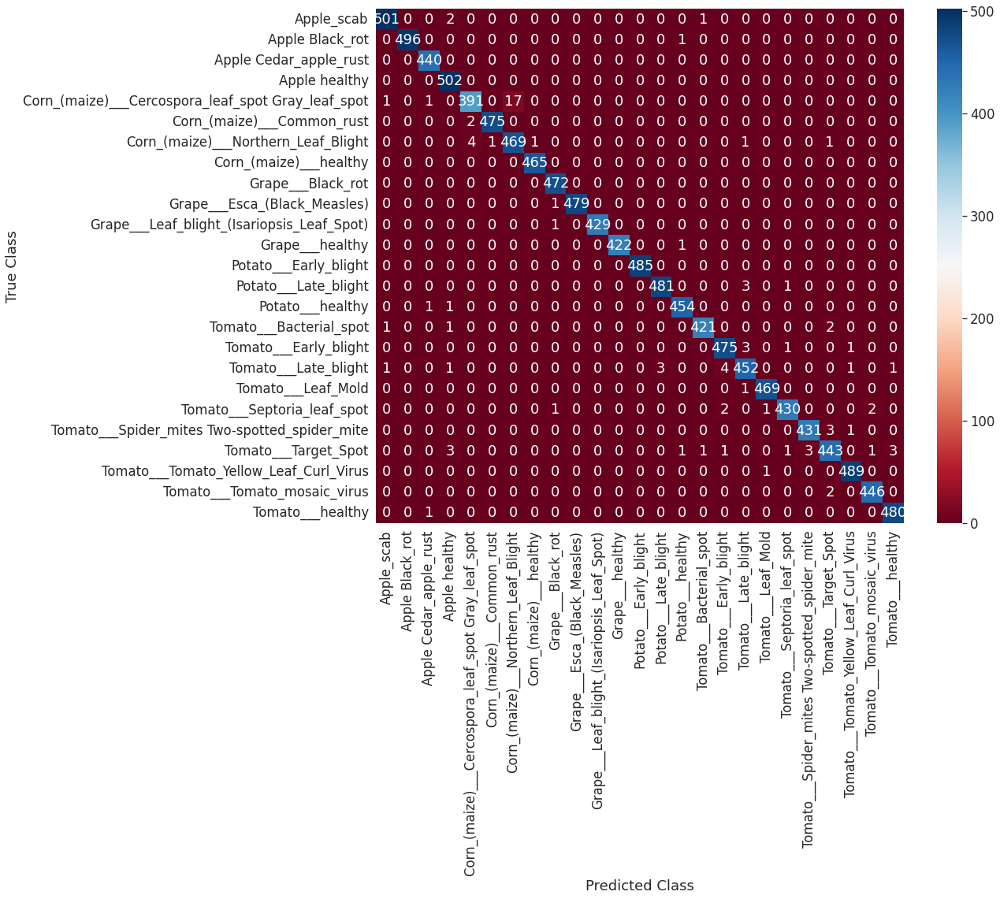

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

class_diseases = ['Apple scab','Apple Black rot','Apple Cedar apple rust','Apple healthy','Corn(maize) Cercospora leaf spot Gray leaf spot','Corn(maize) Common rust','Corn(maize) Northern Leaf Blight','Corn(maize) healthy','Grape Black rot','Grape Esca(Black Measles)','Grape Leaf blight(Isariopsis Leaf Spot)','Grape healthy','Potato Early blight','Potato Late blight','Potato healthy','Tomato Bacterial spot','Tomato Early blight','Tomato Late blight','Tomato Leaf Mold','Tomato Septoria leaf spot','Tomato___Spider_mites Two-spotted_spider_mite','Tomato Target Spot','Tomato Tomato Yellow Leaf Curl Virus','Tomato Tomato mosaic virus','Tomato healthy']
#class_diseases = 
y_true = []
y_pred = []

with torch.no_grad():
    for images, labels in valid_dl:
        images, labels = images.to(device), labels.to(device)
        model = model.to(device) 
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        y_true += labels.tolist()
        y_pred += predicted.tolist()

cm = confusion_matrix(y_true, y_pred)

sns.set(font_scale=1.5)  # increase font size
plt.figure(figsize=(15, 12))  # increase figure size
sns.heatmap(cm, annot=True, cmap='RdBu', fmt='g', xticklabels=class_diseases, yticklabels=class_diseases)
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.show()


In [ ]:
i=0
with torch.no_grad():
    for batch in testdataloader:
        inputs = batch[i]
        i=i+1
        outputs = model.forward(inputs)

TypeError: ignored